In [ ]:
# https://s3.amazonaws.com/research.metamind.io/wikitext/wikitext-2-v1.zip

In [ ]:
import requests
import urllib
import zipfile
import os
import zipfile
import io
%load_ext tensorboard
%matplotlib inline
import tensorflow as tf
import datetime
!rm -rf ./logs/ 

In [ ]:
url = 'https://s3.amazonaws.com/research.metamind.io/wikitext/wikitext-2-v1.zip'
r = requests.get(url, allow_redirects=True)
open('wiki_text.zip', 'wb').write(r.content)

4475746

In [ ]:
cwd=os.getcwd()

In [ ]:
with zipfile.ZipFile(cwd+'/wiki_text.zip', 'r') as zip_ref:
    zip_ref.extractall(cwd)

os.rename('/content/wikitext-2/wiki.test.tokens','/content/wikitext-2/wiki_test.txt') 

In [ ]:
with open('/content/wikitext-2/wiki_test.txt', 'r') as file:
    data = file.read().replace('\n', '')

# Preprocessing

lower case

In [ ]:
data=data.lower()

In [ ]:
data

'  = robert <unk> =   robert <unk> is an english film , television and theatre actor . he had a guest @-@ starring role on the television series the bill in 2000 . this was followed by a starring role in the play herons written by simon stephens , which was performed in 2001 at the royal court theatre . he had a guest role in the television series judge john <unk> in 2002 . in 2004 <unk> landed a role as " craig " in the episode " teddy \'s story " of the television series the long firm ; he starred alongside actors mark strong and derek jacobi . he was cast in the 2005 theatre productions of the philip ridley play mercury fur , which was performed at the drum theatre in plymouth and the <unk> <unk> factory in london . he was directed by john <unk> and starred alongside ben <unk> , shane <unk> , harry kent , fraser <unk> , sophie stanton and dominic hall .  in 2006 , <unk> starred alongside <unk> in the play <unk> written by mark <unk> . he appeared on a 2006 episode of the television 

remove numbers

In [ ]:
from string import digits

#s = 'abc123def456ghi789zero0'
remove_digits = str.maketrans('', '', digits)
data = data.translate(remove_digits)

remove punctuation

In [ ]:
import re
#input_str = “This &is [an] example? {of} string. with.? punctuation!!!!” # Sample string
data = re.sub(r'[^\w\s]', '', data) 


remove white space

In [ ]:
data = data.strip()

remove unk

In [ ]:
data = data.replace(' unk ', ' ')

## tokenization


In [ ]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk
stemmer= PorterStemmer()
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
data_preprocessed=word_tokenize(data)

# word cloud

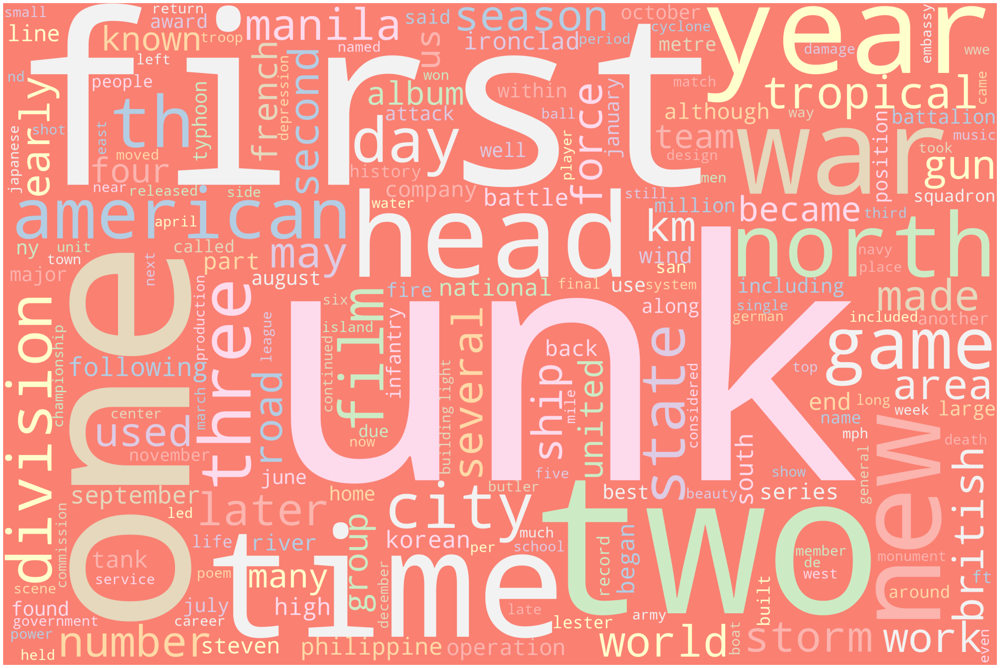

In [ ]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");


# Import package
from wordcloud import WordCloud, STOPWORDS
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(data)
# Plot
plot_cloud(wordcloud)

# CBOW - training

In [ ]:
word_ix={}
ix=0
for word in data_preprocessed:
  if word not in word_ix.keys():
    word_ix[word]=ix
    ix=ix+1

ix_word={}
for word in word_ix.keys():
  ix_word[word_ix[word]]=word

EMBEDDING_DIM = 120


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

N_WORDS = len(word_ix.keys())
embedding_layer = layers.Embedding(N_WORDS, EMBEDDING_DIM, 
                                   embeddings_initializer="RandomNormal",
                                   input_shape=(4,))

In [ ]:
import numpy as np
train_set = []
for i in range(2, len(data_preprocessed)-2):
    target_word = word_ix[data_preprocessed[i]]
    context = [word_ix[data_preprocessed[i-2]],word_ix[data_preprocessed[i-1]],word_ix[data_preprocessed[i+1]], word_ix[data_preprocessed[i+2]]]
    train_set.append((context, target_word))

In [ ]:
X = np.array([example[0] for example in train_set])
y = np.array([example[1] for example in train_set])
y = keras.utils.to_categorical(y, num_classes=N_WORDS)

In [ ]:
model = keras.Sequential([
  embedding_layer,
  layers.GlobalAveragePooling1D(),
  layers.Dense(N_WORDS, activation='softmax'),
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 4, 120)            1409520   
_________________________________________________________________
global_average_pooling1d (Gl (None, 120)               0         
_________________________________________________________________
dense (Dense)                (None, 11746)             1421266   
Total params: 2,830,786
Trainable params: 2,830,786
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

history = model.fit(X,y, batch_size=128,epochs=50,callbacks=[tensorboard_callback])

Epoch 1/50
   1/1444 [..............................] - ETA: 0s - loss: 9.3715 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
1444/1444 [==============================] - 29s 20ms/step - loss: 7.2400 - accuracy: 0.0951
Epoch 2/50
1444/1444 [==============================] - 29s 20ms/step - loss: 6.5913 - accuracy: 0.1126
Epoch 3/50
1444/1444 [==============================] - 29s 20ms/step - loss: 6.3173 - accuracy: 0.1274
Epoch 4/50
1444/1444 [==============================] - 29s 20ms/step - loss: 6.0447 - accuracy: 0.1467
Epoch 5/50
1444/1444 [==============================] - 29s 20ms/step - loss: 5.7908 - accuracy: 0.1670
Epoch 6/50
1444/1444 [==============================] - 29s 20ms/step - loss: 5.5583 - accuracy: 0.1838
Epoch 7/

In [ ]:
%tensorboard --logdir /content/logs/fit

<IPython.core.display.Javascript object>

# Creating vector and metadata file for embedding projector visualization

#### Running below cell will download vec and meta tsv file upload it eo embedding projector for visualizaion of embeddings

In [ ]:
weights=model.get_layer('embedding').get_weights()[0]
vocab = list(word_ix.keys())

out_v = io.open('vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('meta.tsv', 'w', encoding='utf-8')

for num, word in enumerate(vocab):
  if num == 0: continue # skip padding token from vocab
  vec = weights[num]
  out_m.write(word + "\n")
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
out_v.close()
out_m.close()

try:
  from google.colab import files
except ImportError:
  pass
else:
  files.download('vecs.tsv')
  files.download('meta.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Words similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

embeddings={}
for i in word_ix.keys():
  embeddings[i] = embedding_layer(word_ix[i])   

In [ ]:
def similarity(a,b):
  sim=float(cosine_similarity([np.array(embeddings[a])],[  np.array(embeddings[b])]))
  print('similarity between ',a,' and ',b,' is: ',sim)

In [ ]:
similarity('boy','girl')

similarity between  boy  and  girl  is:  -0.005874183028936386
